<a href="https://colab.research.google.com/github/Shivam-316/Image-Colorization-Using-GANs/blob/master/Colorization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>



### Imports

In [ ]:
import tensorflow as tf
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import os
import pathlib
import datetime
import shutil
import time
!pip install kaggle
!pip install tensorflow_io
%load_ext tensorboard
import tensorflow_io as tfio
import IPython.display as display
import absl.logging
absl.logging.set_verbosity(absl.logging.ERROR)

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


### Kaggle Config

In [ ]:
data_dir = '/content/drive/MyDrive/datascience/colorization/datasets'

In [ ]:
%cd '/content/drive/MyDrive/datascience/colorization/datasets'
os.environ['KAGGLE_CONFIG_DIR'] = '/content/drive/MyDrive/datascience/colorization/datasets'

/content/drive/MyDrive/datascience/colorization/datasets


In [ ]:
!kaggle datasets download -d theblackmamba31/landscape-image-colorization

landscape-image-colorization.zip: Skipping, found more recently modified local copy (use --force to force download)


Unzip the dataset, then proceed!!



In [ ]:
#shutil.unpack_archive('landscape-image-colorization.zip', extract_dir=data_dir, format='zip')

### Files Dataset

In [ ]:
color_dir = '/content/drive/MyDrive/datascience/colorization/datasets/landscape Images/color'

In [ ]:
dataset_files = tf.data.Dataset.list_files('/content/drive/MyDrive/datascience/colorization/datasets/landscape Images/color/*.jpg', shuffle=False)

In [ ]:
dataset_files.cardinality()

<tf.Tensor: shape=(), dtype=int64, numpy=7129>

In [ ]:
sample_color_file = str(color_dir) + '/0.jpg'

In [ ]:
sample_color_img = tf.io.read_file(str(color_dir) + '/0.jpg')
sample_color_img = tf.io.decode_jpeg(sample_color_img)
sample_color_img.shape

TensorShape([150, 150, 3])

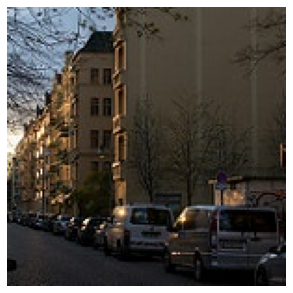

In [ ]:
plt.figure(figsize=(5,8))
plt.imshow(sample_color_img)
plt.axis('off')
plt.show()

### Preprocessing Functions For Images

In [ ]:
BUFFER_SIZE = 4500
BATCH = 1
IMG_HEIGHT = 150
IMG_WIDTH = 150
IMG_CROPPED = 128

In [ ]:
@tf.function()
def load_img(target_img_path):
  target_img = tf.io.read_file(target_img_path)
  target_img = tf.io.decode_jpeg(target_img, channels=3)
  target_img = tf.image.resize(target_img, (IMG_WIDTH, IMG_HEIGHT))
  target_img = tf.cast(target_img, tf.float32)

  return target_img

In [ ]:
@tf.function()
def resize(target_img, height, width):
  target_img = tf.image.resize(
      target_img, (width, height),
      method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
  )

  return target_img

In [ ]:
@tf.function()
def random_crop_rotate(target_img, width, height):
  cropped_img = tf.image.random_crop(target_img, (width, height, 3))
  target_img = tf.image.random_flip_left_right(cropped_img)
  return target_img

In [ ]:
@tf.function()
def random_jitter(target_img):
  target_img = random_crop_rotate(target_img, IMG_CROPPED, IMG_CROPPED)

  return target_img

In [ ]:
@tf.function()
def rbg2lab(target_img, isnormalized = True, normalize_lab = False, comp = ''):
  if not isnormalized:
    target_img = target_img/255.0
  
  # Takes RGB Image in Normalized Form
  target_img = tfio.experimental.color.rgb_to_lab(target_img)
  if normalize_lab:
    tf.Assert(tf.reduce_any(tf.equal(comp, ['vis', 'net'])), data=[comp], name='Lab_Normalization_Error')
    if comp == 'vis':
      target_img = (target_img + [0, 128, 128]) / [100., 255., 255.] # 0-1 range
    else:
      target_img = target_img / [50., 127.5, 127.5] + [-1, 0., 0.]   # -1 to 1 range
  return target_img

In [ ]:
@tf.function()
def lab2rgb(lab_img, isnormalized = False, comp = ''):
  if isnormalized:
    tf.Assert(tf.reduce_any(tf.equal(comp, ['vis', 'net'])), data=[comp], name='Lab_Normalization_Error')
    if comp == 'vis':
      lab_img = lab_img * [100.,255., 255.] + [0, -128, -128]; # from 0-1 range
    else:
      lab_img = (lab_img + [1.,0., 0.]) * [50., 127.5, 127.5]; # from -1 to 1 range
  
  # Take LAB Image in Unnormalized Form.
  rgb = tfio.experimental.color.lab_to_rgb(lab_img) 
  return rgb

In [ ]:
@tf.function()
def load_train_img(color_file, comp = ''):
  target_img = load_img(color_file)
  target_img = random_jitter(target_img)
  target_img = rbg2lab(target_img, isnormalized=False, normalize_lab=True, comp = comp)
  return target_img[..., 0, tf.newaxis] , target_img[..., 1:]

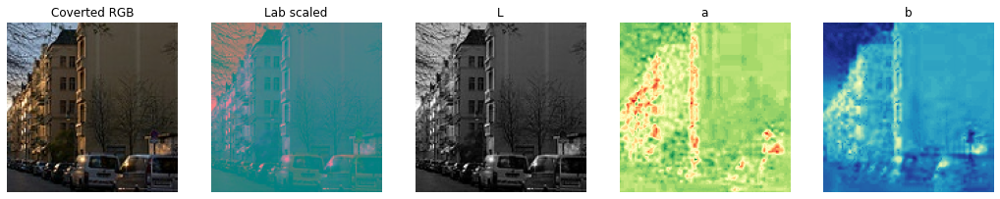

In [ ]:
fig, ax = plt.subplots(1, 5, figsize=(18,30))
for c_img in dataset_files.take(1):
  L, ab = load_train_img(c_img, comp='vis')
  target_img = tf.concat([L, ab], axis=-1)
  ax[0].imshow(lab2rgb(target_img, isnormalized=True, comp = 'vis'))
  ax[0].axis('off')
  ax[0].set_title('Coverted RGB')

  ax[1].imshow(target_img)
  ax[1].axis('off')
  ax[1].set_title('Lab scaled')

  ax[2].imshow(target_img[...,0], cmap = 'gray')
  ax[2].axis('off')
  ax[2].set_title('L')

  ax[3].imshow(target_img[...,1], cmap='RdYlGn_r')
  ax[3].axis('off')
  ax[3].set_title('a')

  ax[4].imshow(target_img[...,2], cmap='YlGnBu_r')
  ax[4].axis('off')
  ax[4].set_title('b')
fig.show()

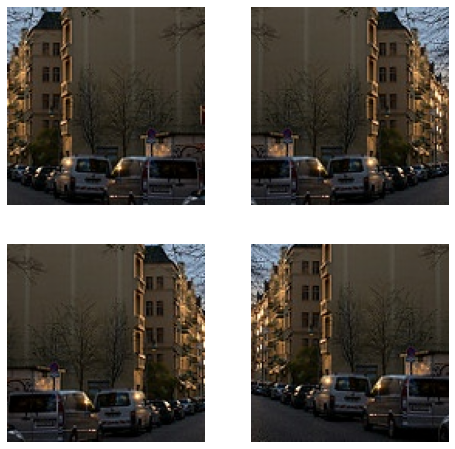

In [ ]:
plt.figure(figsize=(8,8))
for c_img in dataset_files.take(1):
  for i in range(4):
     plt.subplot(2,2,i+1)
     L, ab = load_train_img(c_img, comp='vis')
     target_img = tf.concat([L, ab], axis=-1)
     plt.imshow(lab2rgb(target_img, isnormalized = True, comp = 'vis'))
     plt.axis('off')
  plt.show()

In [ ]:
@tf.function()
def load_test_img(color_file, comp = ''):
  target_img = load_img(color_file)
  target_img = resize(target_img, IMG_CROPPED, IMG_CROPPED)
  target_img = rbg2lab(target_img, isnormalized=False, normalize_lab=True, comp = comp)

  return target_img[..., 0, tf.newaxis] , target_img[..., 1:]

### Data Piplines

In [ ]:
DATASET_SIZE = dataset_files.cardinality().numpy()

In [ ]:
test_size = int(DATASET_SIZE * 0.1)
eval_size = int(DATASET_SIZE * 0.2)
train_size = int(DATASET_SIZE * 0.7)

In [ ]:
dataset_files = dataset_files.shuffle(BUFFER_SIZE, reshuffle_each_iteration=False)

In [ ]:
train_dataset_files = dataset_files.skip(test_size + eval_size)
test_dataset_files = dataset_files.take(test_size)
eval_dataset_files = dataset_files.take(eval_size)

In [ ]:
train_dataset = train_dataset_files.interleave(
    lambda tar_img : tf.data.Dataset.from_tensors(load_train_img(tar_img, comp = 'net')),
    num_parallel_calls=tf.data.AUTOTUNE, deterministic=False
)
eval_dataset = eval_dataset_files.interleave(
    lambda tar_img : tf.data.Dataset.from_tensors(load_train_img(tar_img, comp = 'net')),
    num_parallel_calls=tf.data.AUTOTUNE, deterministic=False
)
test_dataset = test_dataset_files.interleave(
    lambda tar_img : tf.data.Dataset.from_tensors(load_test_img(tar_img, comp = 'net')),
    num_parallel_calls=tf.data.AUTOTUNE
)

In [ ]:
train_dataset = train_dataset.cache().batch(BATCH).prefetch(tf.data.AUTOTUNE)
test_dataset = test_dataset.cache().batch(BATCH).prefetch(tf.data.AUTOTUNE)
eval_dataset = eval_dataset.cache().batch(BATCH).prefetch(tf.data.AUTOTUNE)

In [ ]:
for i,j in train_dataset.take(1):
  print(i.shape, j.shape)

(1, 128, 128, 1) (1, 128, 128, 2)


In [ ]:
for i,j in test_dataset.take(1):
  print(i.shape, j.shape)

(1, 128, 128, 1) (1, 128, 128, 2)


### Model

#### Base Layers

In [ ]:
def downsample(filters, kernel_size, batch_normalization = True, activation = True):
  pipeline = tf.keras.Sequential()

  pipeline.add(
      tf.keras.layers.Conv2D(
        filters=filters, kernel_size=kernel_size,
        strides=2, padding='same',
        use_bias = False
      )
  )

  if batch_normalization:
    pipeline.add(tf.keras.layers.BatchNormalization())
  
  if activation:
    pipeline.add(tf.keras.layers.LeakyReLU())

  return pipeline

In [ ]:
def upsample(filters, kernel_size, dropout=False, activation = True):
  pipeline = tf.keras.Sequential()

  pipeline.add(
      tf.keras.layers.Conv2DTranspose(
          filters, kernel_size, strides=2,
          padding = 'same',
          use_bias = False
      )
  )

  if dropout:
    pipeline.add(tf.keras.layers.Dropout(0.4))

  if activation:
    pipeline.add(tf.keras.layers.ReLU())

  return pipeline

#### Generator - UNet

In [ ]:
def Generator():
  inputs = tf.keras.layers.Input(shape=[128, 128, 1])

  downstack = [                   # output
        downsample(32, 4, False), # (64, 64, 32)
        downsample(64, 4),        # (32, 32, 64)
        downsample(128, 4),        # (16, 16, 64)
        downsample(128,4),        # (8, 8, 128)
        downsample(256,4),        # (4, 4, 128)
        downsample(256,4),        # (2, 2, 256)
        downsample(512,4),        # (1, 1, 512)
  ]

  upstack = [                     # output
        upsample(512, 4, True),   # (2, 2, 512)
        upsample(256, 4, True),   # (4, 4, 256)
        upsample(256, 4, True),   # (8 , 8, 256)
        upsample(128, 4, True),   # (16, 16, 128)
        upsample(128, 4),         # (32, 32, 128)
        upsample(64,  4),         # (64, 64, 64)
  ]

  last = tf.keras.layers.Conv2DTranspose(
      2, 4, strides=2,
      padding='same',
      activation = 'tanh')        # (128, 128, 2) 

  x = inputs
  skips = []
  for down in downstack:
    x = down(x)
    skips.append(x)
  skips = reversed(skips[:-1])

  for id, (up, skip) in enumerate(zip(upstack, skips)):
    x = up(x)
    x = tf.keras.layers.Concatenate()([x, skip])
  
  x = last(x)
  return tf.keras.Model(inputs, x)

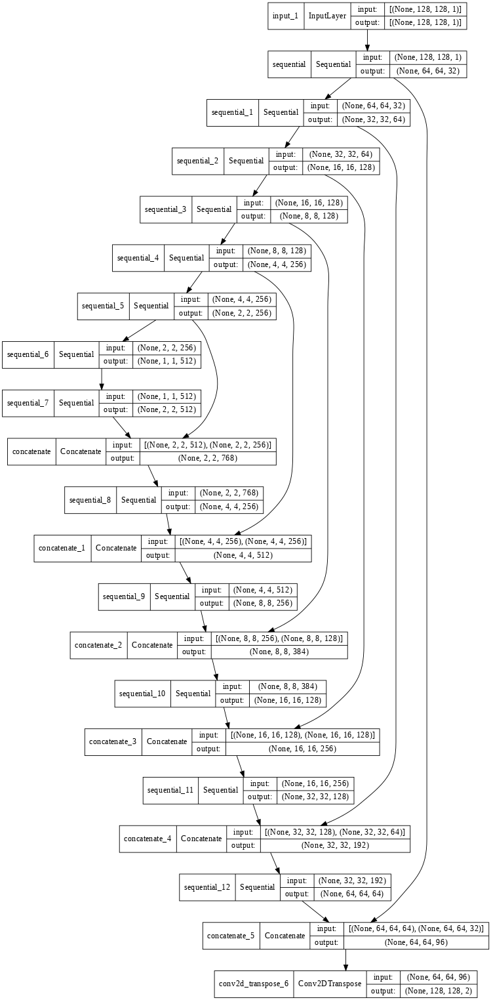

In [ ]:
generator = Generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=64)

In [ ]:
generator.summary()

Model: "model"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_1 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 sequential (Sequential)        (None, 64, 64, 32)   512         ['input_1[0][0]']                
                                                                                                  
 sequential_1 (Sequential)      (None, 32, 32, 64)   33024       ['sequential[0][0]']             
                                                                                                  
 sequential_2 (Sequential)      (None, 16, 16, 128)  131584      ['sequential_1[0][0]']       

#### Discriminator - PatchGAN

In [ ]:
def Discriminator():
  inp = tf.keras.layers.Input(shape=(128,128,1))
  tar = tf.keras.layers.Input(shape=(128,128,2))

  x = tf.keras.layers.concatenate([inp, tar])
  
  down1 = downsample(32, 4, batch_normalization = False)(x)                      # (64, 64, 32)

  down2 = downsample(64, 4, )(down1)                                             # (32, 32, 64)

  down3 = downsample(128, 4, )(down2)                                            # (16, 16, 128)

  zpad1 = tf.keras.layers.ZeroPadding2D()(down3)                                 # (18, 18, 128)                 

  conv = tf.keras.layers.Conv2D(256, 4, strides = 1, use_bias = False) (zpad1)   # (15, 15, 256)                 
  batchnorm1 = tf.keras.layers.BatchNormalization()(conv)
  leaky_relu = tf.keras.layers.LeakyReLU()(batchnorm1)

  last = tf.keras.layers.Conv2D(1, 4, strides=1, padding='same')(leaky_relu)      # (15, 15, 1)
 
  return tf.keras.Model(inputs=[inp, tar], outputs=last)

In [ ]:
discriminator = Discriminator()
#tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=64)

In [ ]:
discriminator.summary()

Model: "model_1"
__________________________________________________________________________________________________
 Layer (type)                   Output Shape         Param #     Connected to                     
 input_2 (InputLayer)           [(None, 128, 128, 1  0           []                               
                                )]                                                                
                                                                                                  
 input_3 (InputLayer)           [(None, 128, 128, 2  0           []                               
                                )]                                                                
                                                                                                  
 concatenate_6 (Concatenate)    (None, 128, 128, 3)  0           ['input_2[0][0]',                
                                                                  'input_3[0][0]']          

### Training Method

#### Losses

In [ ]:
LAMBDA_STRUCT = 100

In [ ]:
binary_loss = tf.keras.losses.BinaryCrossentropy(from_logits = True)
binary_loss_smooth = tf.keras.losses.BinaryCrossentropy(from_logits = True, label_smoothing=0.1)

In [ ]:
@tf.function()
def generator_loss(disc_gen_output, gen_target_img, target_img):
  labels = tf.ones_like(disc_gen_output)
  gan_loss = binary_loss(labels, disc_gen_output)
  struct_loss = tf.reduce_mean(tf.abs(target_img - gen_target_img))
  total_loss = gan_loss + (LAMBDA_STRUCT * struct_loss)

  return total_loss, gan_loss, struct_loss

In [ ]:
@tf.function()
def discriminator_loss(disc_real_output, disc_gen_out):
  labels = tf.ones_like(disc_real_output)
  real_loss = binary_loss_smooth(labels, disc_real_output)

  labels = tf.zeros_like(disc_gen_out)
  fake_loss = binary_loss_smooth(labels, disc_gen_out)

  return real_loss + fake_loss

#### Metrics

In [ ]:
total_gen_loss_tracker = tf.keras.metrics.Mean(name="Avg_Total_Gen_Loss")
disc_loss_tracker = tf.keras.metrics.Mean(name="Avg_Disc_Loss")

#### Optimizers

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0003)
discriminator_optimizer = tf.keras.optimizers.Adam(learning_rate=0.0001)

#### GAN Model

In [ ]:
class GAN(tf.keras.Model):
  def __init__(self, generator, discriminator, **kwargs):
    super(GAN, self).__init__(**kwargs)
    self.generator = generator
    self.discriminator = discriminator
  
  def compile(self, generator_optimizer, discriminator_optimizer, loss_fn, metric_fn):
    super(GAN, self).compile()
    self.generator_optimizer = generator_optimizer
    self.discriminator_optimizer = discriminator_optimizer
    self.loss_fn = loss_fn
    self.metric_fn = metric_fn
  
  def call(self, input, training = False):
    fake_tar_img = self.generator(input, training = training)
    return fake_tar_img
  
  def train_step(self, images):
    input_img, target_img = images
    with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
      fake_tar_img = self(input_img, training = True)
      disc_real_output = self.discriminator([input_img, target_img], training = True)
      disc_fake_output = self.discriminator([input_img, fake_tar_img], training = True)

      total_gen_loss, gan_loss, struct_loss = self.loss_fn['generator_loss'](disc_fake_output, fake_tar_img, target_img)
      disc_loss = self.loss_fn['discriminator_loss'](disc_real_output, disc_fake_output)

    generator_gradients = gen_tape.gradient(total_gen_loss, generator.trainable_variables)
    discriminator_gradients = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    self.generator_optimizer.apply_gradients(zip(generator_gradients, generator.trainable_variables))
    self.discriminator_optimizer.apply_gradients(zip(discriminator_gradients, discriminator.trainable_variables))

    self.metric_fn['total_gen_loss_tracker'].update_state(total_gen_loss)
    self.metric_fn['disc_loss_tracker'].update_state(disc_loss)

    return {
        'Avg_Total_Gen_Loss': self.metric_fn['total_gen_loss_tracker'].result(),
        'Disc_Loss': self.metric_fn['disc_loss_tracker'].result()
    }
  
  def test_step(self, images):
    input_img, target_img = images
    fake_tar_img = self(input_img, training = True)

    disc_real_output = self.discriminator([input_img, target_img], training = True)
    disc_fake_output = self.discriminator([input_img, fake_tar_img], training = True)

    total_gen_loss, gan_loss, struct_loss = self.loss_fn['generator_loss'](disc_fake_output, fake_tar_img, target_img)
    disc_loss = self.loss_fn['discriminator_loss'](disc_real_output, disc_fake_output)

    self.metric_fn['total_gen_loss_tracker'].update_state(total_gen_loss)
    self.metric_fn['disc_loss_tracker'].update_state(disc_loss)

    return {
        'Avg_Total_Gen_Loss': self.metric_fn['total_gen_loss_tracker'].result(),
        'Disc_Loss': self.metric_fn['disc_loss_tracker'].result()
    }

  def get_config(self):
    return {'generator': self.generator, 'discriminator': self.discriminator}

  @property
  def metrics(self):
    return [self.metric_fn['total_gen_loss_tracker'], self.metric_fn['disc_loss_tracker']]

#### Model Compilatiom

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/datascience/colorization/checkpoints/' + datetime.datetime.now().strftime("%Y-%m-%d-%H:%M:%S")
log_dir = '/content/drive/MyDrive/datascience/colorization/logs/train/' + datetime.datetime.now().strftime("%Y-%m-%d-%H:%M:%S")
_callbacks = [
    tf.keras.callbacks.ModelCheckpoint(checkpoint_dir, monitor = f'val_{total_gen_loss_tracker.name}', mode = 'min', save_best_only=True),
    tf.keras.callbacks.TensorBoard(log_dir, write_images=True, update_freq = 1000),
]

In [ ]:
gan = GAN(discriminator=discriminator, generator=generator)
gan.compile(
    generator_optimizer,
    discriminator_optimizer,
    loss_fn= {
        'generator_loss': generator_loss,
        'discriminator_loss': discriminator_loss
    },
    metric_fn = {
        'total_gen_loss_tracker': total_gen_loss_tracker,
        'disc_loss_tracker': disc_loss_tracker,
    }
)

#### Model Training

In [ ]:
his = gan.fit(train_dataset, validation_data = eval_dataset, epochs=5, callbacks=_callbacks)

Epoch 1/5
   4992/Unknown - 255s 49ms/step - Avg_Total_Gen_Loss: 7.4781 - Disc_Loss: 1.1294

INFO:tensorflow:Assets written to: /content/drive/MyDrive/datascience/colorization/checkpoints2022-01-17-16:54:27/assets


INFO:tensorflow:Assets written to: /content/drive/MyDrive/datascience/colorization/checkpoints2022-01-17-16:54:27/assets


4992/4992 [==============================] - 287s 55ms/step - Avg_Total_Gen_Loss: 7.4781 - Disc_Loss: 1.1294 - val_Avg_Total_Gen_Loss: 7.8709 - val_Disc_Loss: 1.0337
Epoch 2/5
4991/4992 [============================>.] - ETA: 0s - Avg_Total_Gen_Loss: 7.3770 - Disc_Loss: 1.1130

INFO:tensorflow:Assets written to: /content/drive/MyDrive/datascience/colorization/checkpoints2022-01-17-16:54:27/assets


INFO:tensorflow:Assets written to: /content/drive/MyDrive/datascience/colorization/checkpoints2022-01-17-16:54:27/assets


4992/4992 [==============================] - 275s 55ms/step - Avg_Total_Gen_Loss: 7.3763 - Disc_Loss: 1.1130 - val_Avg_Total_Gen_Loss: 7.8694 - val_Disc_Loss: 1.0292
Epoch 3/5
4992/4992 [==============================] - 262s 52ms/step - Avg_Total_Gen_Loss: 7.2686 - Disc_Loss: 1.1192 - val_Avg_Total_Gen_Loss: 8.0071 - val_Disc_Loss: 1.1968
Epoch 4/5
4992/4992 [==============================] - 263s 53ms/step - Avg_Total_Gen_Loss: 7.0861 - Disc_Loss: 1.1287 - val_Avg_Total_Gen_Loss: 8.0451 - val_Disc_Loss: 1.0280
Epoch 5/5
4992/4992 [==============================] - 263s 53ms/step - Avg_Total_Gen_Loss: 6.9243 - Disc_Loss: 1.1147 - val_Avg_Total_Gen_Loss: 7.9765 - val_Disc_Loss: 1.0650


In [ ]:
%tensorboard --logdir '/content/drive/MyDrive/datascience/colorization/logs/train'

<IPython.core.display.Javascript object>

### Displaying Images

In [ ]:
def generate_images(test_L, test_ab):
  pred_ab = gan(test_L, training = True)
  pred_lab = tf.concat([test_L, pred_ab], axis=-1)
  pred_rgb = lab2rgb(pred_lab, isnormalized=True, comp='net')

  test_lab = tf.concat([test_L, test_ab], axis=-1)
  test_rgb = lab2rgb(test_lab, isnormalized=True, comp='net')

  display_list = [test_rgb, pred_rgb]

  plt.figure(figsize=(8,8))
  title = ['Ground Truth', 'Predicted Image']

  for i in range(2):
    plt.subplot(1, 2, i+1)
    plt.title(title[i])
    plt.imshow(display_list[i][0])
    plt.axis('off')
  plt.show()

### Saving Model and Testing

In [ ]:
save_path = '/content/drive/MyDrive/datascience/colorization/model/' + datetime.datetime.now().strftime("%Y-%m-%d-%H:%M:%S")
gan.save(save_path, save_traces = True)

In [ ]:
del GAN, gan, generator, discriminator, generator_loss, generator_optimizer, discriminator_loss, discriminator_optimizer, disc_loss_tracker, total_gen_loss_tracker

In [ ]:
gan = tf.keras.models.load_model(save_path)

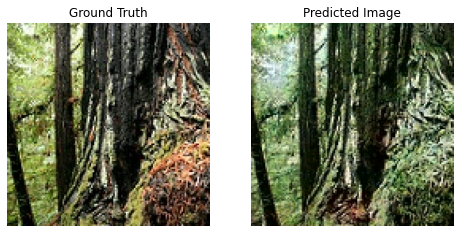

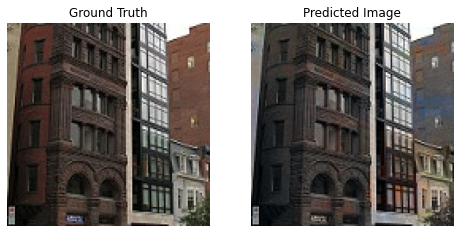

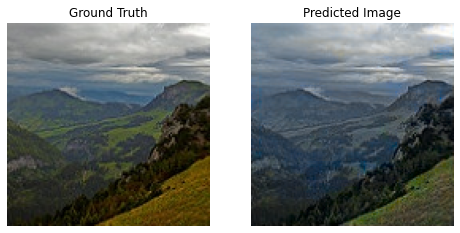

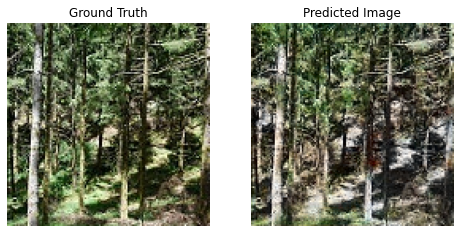

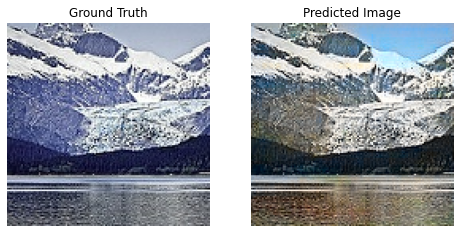

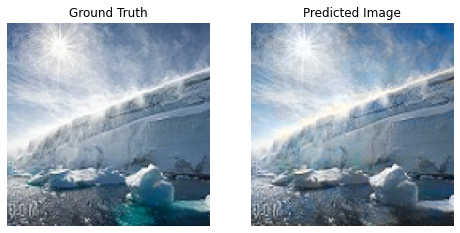

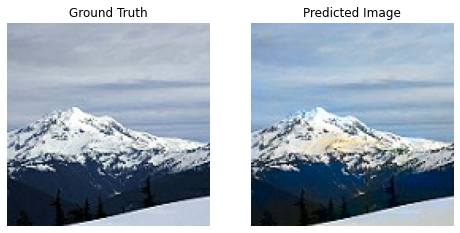

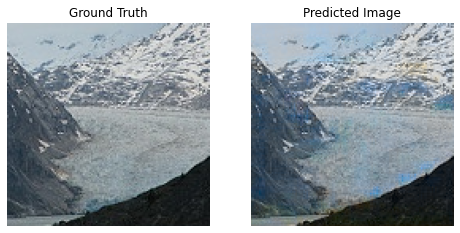

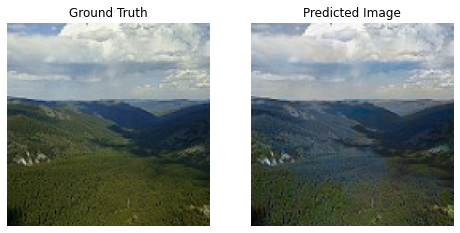

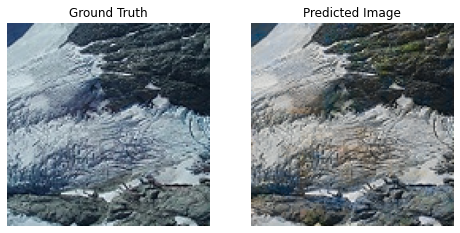

In [ ]:
for L, ab in eval_dataset.take(10):
  generate_images(L, ab)